# Mount Drive

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Importing Libraries

In [ ]:
import os
import random
import shutil
import glob
from IPython.display import Image, display
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import torch

# Dataset Details

In [ ]:
import os

# Define the folder path
folder_path = '/content/drive/MyDrive/MLR/S3R2-KIIT'
files = os.listdir(folder_path)

for file in files:
    print(file)

train
valid
test
S3R2_data.yml


In [ ]:
import os

# Define the paths for train, valid, and test directories
base_dir = '/content/drive/MyDrive/MLR/S3R2-KIIT'
dirs = ['train', 'valid', 'test']

for dir_name in dirs:
    dir_path = os.path.join(base_dir, dir_name)
    print(f"\nDirectory: {dir_name}")
    for subfolder in os.listdir(dir_path):
        subfolder_path = os.path.join(dir_path, subfolder)

        if os.path.isdir(subfolder_path):
            num_files = len([f for f in os.listdir(subfolder_path) if os.path.isfile(os.path.join(subfolder_path, f))])
            print(f"  Subfolder: {subfolder}, Number of files: {num_files}")



Directory: train
  Subfolder: images, Number of files: 1360
  Subfolder: labels, Number of files: 1360

Directory: valid
  Subfolder: images, Number of files: 170
  Subfolder: labels, Number of files: 170

Directory: test
  Subfolder: images, Number of files: 170
  Subfolder: labels, Number of files: 170


In [ ]:
yaml_file_path = '/content/drive/MyDrive/MLR/S3R2-KIIT/S3R2_data.yml'
with open(yaml_file_path, 'r') as file:
    yaml_content = file.read()

print(yaml_content)


names:
  - Artilary
  - Missile
  - Radar
  - M. Rocket Launcher
  - Soldier
  - Tank
  - Vehicle
nc: 7
train: /content/drive/MyDrive/MLR/S3R2-KIIT/train/images
val: /content/drive/MyDrive/MLR/S3R2-KIIT/test/images
test: /content/drive/MyDrive/MLR/S3R2-KIIT/valid/images



Let's see the information of a annotation file...

In [ ]:
import os

label_dir = '/content/drive/MyDrive/MLR/S3R2-KIIT/train/labels/'
label_file = 'image_s3r2_kiit_1009.txt'

label_path = os.path.join(label_dir, label_file)

if not os.path.exists(label_path):
    print(f"Label file not found: {label_path}")
else:
    with open(label_path, 'r') as f:
        lines = f.readlines()

    print(f"Label file: {label_file}")
    for line in lines:
        class_id, x_center, y_center, width, height = map(float, line.strip().split())

        print(f"Class ID: {int(class_id)}")
        print(f"Bounding Box: x_center={x_center}, y_center={y_center}, width={width}, height={height}")
        print("-" * 50)

Label file: image_s3r2_kiit_1009.txt
Class ID: 1
Bounding Box: x_center=0.312686, y_center=0.245046, width=0.124352, height=0.095245
--------------------------------------------------
Class ID: 1
Bounding Box: x_center=0.165318, y_center=0.280107, width=0.140403, height=0.120337
--------------------------------------------------
Class ID: 1
Bounding Box: x_center=0.620541, y_center=0.578374, width=0.28465, height=0.285706
--------------------------------------------------
Class ID: 1
Bounding Box: x_center=0.412304, y_center=0.407393, width=0.203758, height=0.168834
--------------------------------------------------


In [ ]:
# Class names as per our dataset
class_names = [
    "Artilary",             # ID 0
    "Missile",              # ID 1
    "Radar",                # ID 2
    "M. Rocket Launcher",   # ID 3
    "Soldier",              # ID 4
    "Tank",                 # ID 5
    "Vehicle"               # ID 6
]

# Visualization

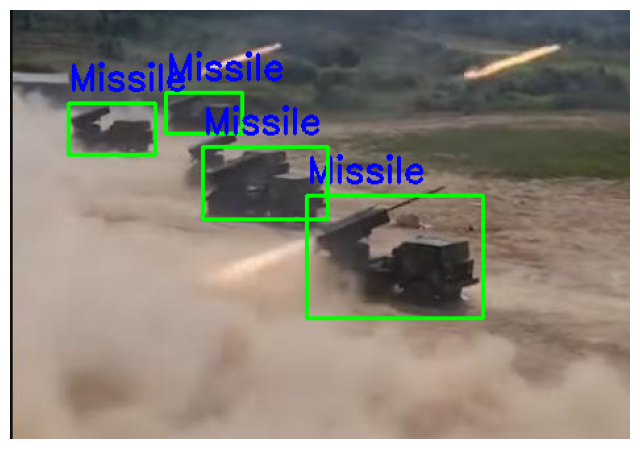

In [ ]:
import os
import cv2
import matplotlib.pyplot as plt

# Class names as per your dataset
class_names = [
    "Artilary",             # ID 0
    "Missile",              # ID 1
    "Radar",                # ID 2
    "M. Rocket Launcher",   # ID 3
    "Soldier",              # ID 4
    "Tank",                 # ID 5
    "Vehicle"               # ID 6
]

image_dir = '/content/drive/MyDrive/MLR/S3R2-KIIT/train/images'
annotation_dir = '/content/drive/MyDrive/MLR/S3R2-KIIT/train/labels'

def visualize_image_with_annotations(image_name):
    image_path = os.path.join(image_dir, image_name)
    img = cv2.imread(image_path)

    if img is None:
        print(f"Image not found: {image_path}")
        return

    annotation_name = os.path.splitext(image_name)[0] + '.txt'
    annotation_path = os.path.join(annotation_dir, annotation_name)

    if not os.path.exists(annotation_path):
        print(f"Annotation not found: {annotation_path}")
        return

    img_height, img_width = img.shape[:2]

    with open(annotation_path, 'r') as f:
        lines = f.readlines()

    for line in lines:
        # Parse values and convert class_id to integer
        class_id, x_center, y_center, width, height = map(float, line.strip().split())
        class_id = int(class_id)  # Ensure class_id is an integer

        x_center = int(x_center * img_width)
        y_center = int(y_center * img_height)
        width = int(width * img_width)
        height = int(height * img_height)

        x_min = int(x_center - width / 2)
        y_min = int(y_center - height / 2)
        x_max = int(x_center + width / 2)
        y_max = int(y_center + height / 2)

        cv2.rectangle(img, (x_min, y_min), (x_max, y_max), color=(0, 255, 0), thickness=2)

        # Check if class_id is within bounds and retrieve class name
        if 0 <= class_id < len(class_names):
            class_name = class_names[class_id]
            cv2.putText(img, class_name, (x_min, y_min - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (255, 0, 0), 2)
        else:
            print(f"Class ID {class_id} is out of bounds for class names list.")

    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    plt.figure(figsize=(8, 8))
    plt.imshow(img_rgb)
    plt.axis('off')
    plt.show()

visualize_image_with_annotations('image_s3r2_kiit_1009.jpeg')  # Image to Visualize


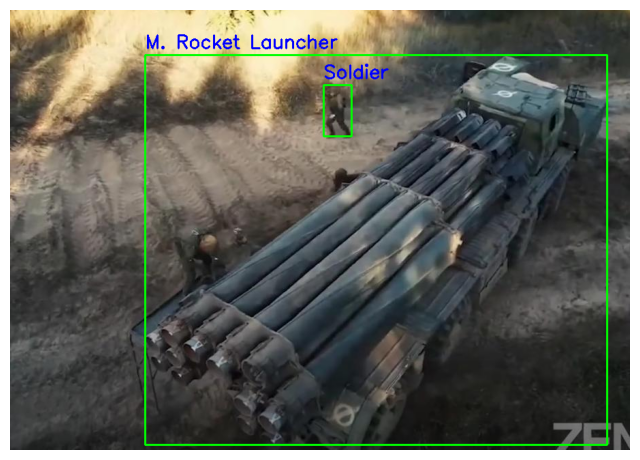

In [ ]:
visualize_image_with_annotations('image_s3r2_kiit_985.jpeg')

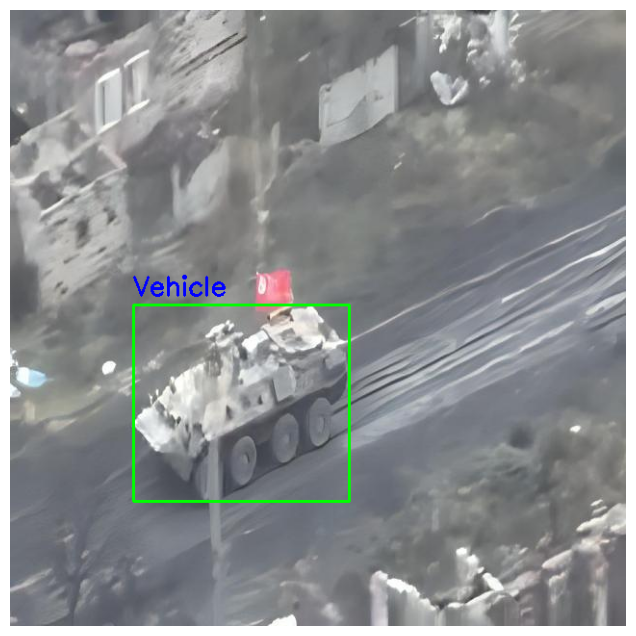

In [ ]:
visualize_image_with_annotations('image_s3r2_kiit_836.jpeg')

# Cheking for GPU

In [ ]:
if torch.cuda.is_available():
    gpu_info = torch.cuda.get_device_properties(0)
    print(f"GPU is available: {gpu_info.name}")
    print(f"Total Memory: {gpu_info.total_memory / (1024**3):.2f} GB")
    print(f"CUDA Capability: {gpu_info.major}.{gpu_info.minor}")
else:
    print("GPU not available, running on CPU.")


GPU is available: Tesla T4
Total Memory: 14.75 GB
CUDA Capability: 7.5


In [ ]:
!nvidia-smi

Mon Nov  4 13:22:57 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   40C    P8               9W /  70W |      3MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

# Setting up YOLOV11-NANO...

In [ ]:
%pip install ultralytics supervision roboflow
import ultralytics
ultralytics.checks()

Ultralytics 8.3.27 🚀 Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 32.4/112.6 GB disk)


Using the YOLOv8_NANO model

In [ ]:
# !yolo task=detect mode=train model=yolov8s.pt data=/content/drive/MyDrive/MLR/S3R2-KIIT/data.yml epochs=100 imgsz=640 plots=True
!yolo task=detect mode=train model=/content/yolo11n.pt data=/content/drive/MyDrive/MLR/S3R2-KIIT/S3R2_data.yml epochs=100 imgsz=640 plots=True

100% 5.35M/5.35M [00:00<00:00, 351MB/s]
Ultralytics 8.3.27 🚀 Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=/content/yolo11n.pt, data=/content/drive/MyDrive/MLR/S3R2-KIIT/S3R2_data.yml, epochs=100, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save

# Saving the result into drive

In [ ]:
from google.colab import drive
import shutil

source_path = '/content/runs'
destination_path = '/content/drive/MyDrive/MLR/Yolo11NANO_output'
shutil.copytree(source_path, destination_path)

print(f"The `runs` folder has been copied to: {destination_path}")

The `runs` folder has been copied to: /content/drive/MyDrive/MLR/Yolo11NANO_output


# Result Analysis

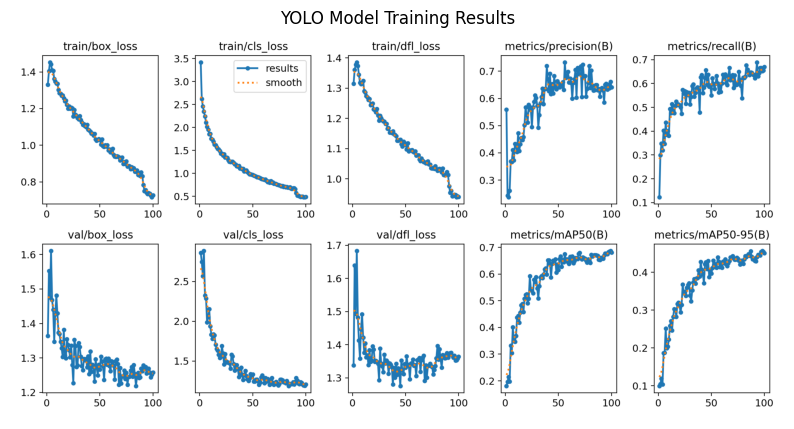

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Load and display the results image
results_image_path = '/content/runs/detect/train/results.png'
img = mpimg.imread(results_image_path)

plt.figure(figsize=(10, 6))
plt.imshow(img)
plt.axis('off')  # Hide axes
plt.title('YOLO Model Training Results')
plt.show()


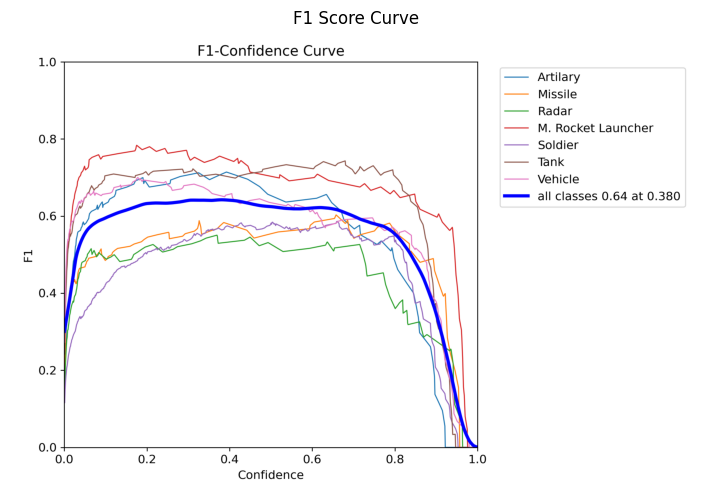

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Load and display the F1 curve image
f1_curve_path = '/content/runs/detect/train/F1_curve.png'
img = mpimg.imread(f1_curve_path)

plt.figure(figsize=(10, 6))
plt.imshow(img)
plt.axis('off')  # Hide axes
plt.title('F1 Score Curve')
plt.show()


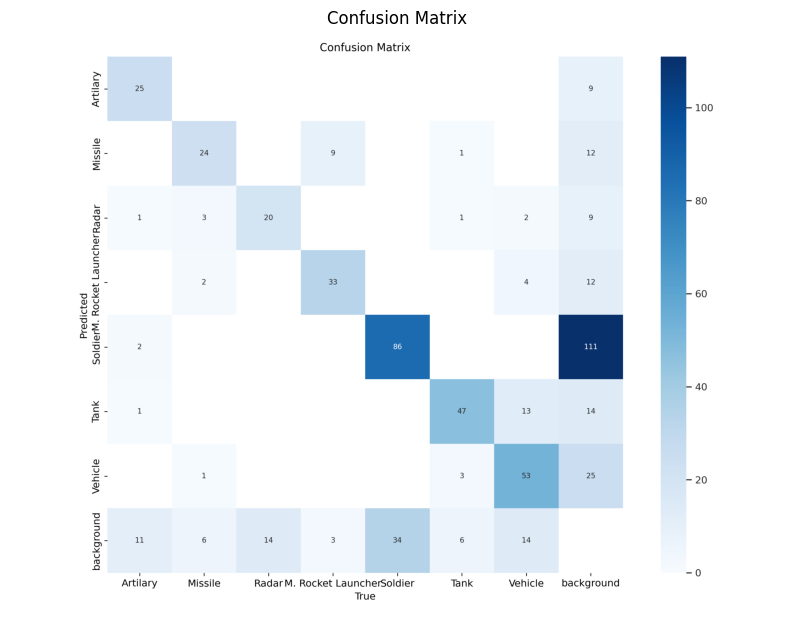

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Path to the confusion matrix image
image_path = '/content/runs/detect/train/confusion_matrix.png'

# Read and display the image
img = mpimg.imread(image_path)
plt.figure(figsize=(10, 8))
plt.imshow(img)
plt.axis('off')  # Hide the axes
plt.title('Confusion Matrix')
plt.show()


# Detection

Single Image Detection

In [ ]:
# !yolo task=detect mode=predict model=/content/runs/detect/train/weights/best.pt conf=0.40 source=/content/drive/MyDrive/MLR/S3R2-KIIT/valid/images/image_s3r2_kiit_176.jpeg save=True
!yolo task=detect mode=predict model=/content/runs/detect/train/weights/best.pt conf=0.25 source=/content/drive/MyDrive/MLR/S3R2-KIIT/test/images/image_s3r2_kiit_1043.jpeg save=True

Ultralytics 8.3.27 🚀 Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLO11n summary (fused): 238 layers, 2,583,517 parameters, 0 gradients, 6.3 GFLOPs

image 1/1 /content/drive/MyDrive/MLR/S3R2-KIIT/test/images/image_s3r2_kiit_1043.jpeg: 640x640 1 Tank, 9.8ms
Speed: 3.0ms preprocess, 9.8ms inference, 578.9ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/detect/predict2
💡 Learn more at https://docs.ultralytics.com/modes/predict


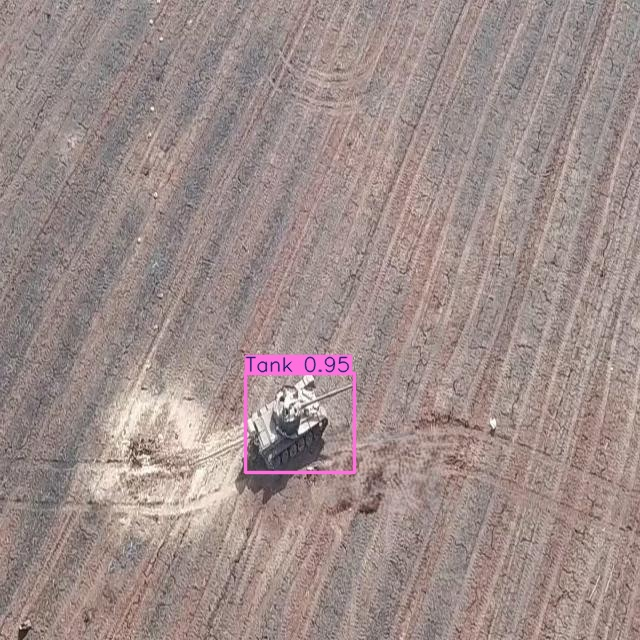

In [ ]:
import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/runs/detect/predict2/image_s3r2_kiit_1043.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

Multiple Image detection

In [ ]:
!yolo task=detect mode=predict model=/content/runs/detect/train/weights/best.pt conf=0.45 source=/content/drive/MyDrive/MLR/test_images save=True

Ultralytics 8.3.27 🚀 Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLO11n summary (fused): 238 layers, 2,583,517 parameters, 0 gradients, 6.3 GFLOPs

image 1/11 /content/drive/MyDrive/MLR/test_images/M. Launcher.jpeg: 640x544 1 M. Rocket Launcher, 1 Soldier, 41.5ms
image 2/11 /content/drive/MyDrive/MLR/test_images/Missile_1.jpeg: 640x640 1 M. Rocket Launcher, 9.2ms
image 3/11 /content/drive/MyDrive/MLR/test_images/Radar.jpeg: 480x640 1 Radar, 41.6ms
image 4/11 /content/drive/MyDrive/MLR/test_images/artilary.jpeg: 512x640 1 Artilary, 1 Soldier, 43.2ms
image 5/11 /content/drive/MyDrive/MLR/test_images/m_rock_launch.jpeg: 416x640 1 M. Rocket Launcher, 42.9ms
image 6/11 /content/drive/MyDrive/MLR/test_images/missile_2.jpeg: 576x640 1 Missile, 40.0ms
image 7/11 /content/drive/MyDrive/MLR/test_images/radar_1.jpeg: 640x544 1 Radar, 8.2ms
image 8/11 /content/drive/MyDrive/MLR/test_images/soldier2.jpeg: 640x640 2 Soldiers, 10.6ms
image 9/11 /content/drive/MyDrive/MLR/test_images

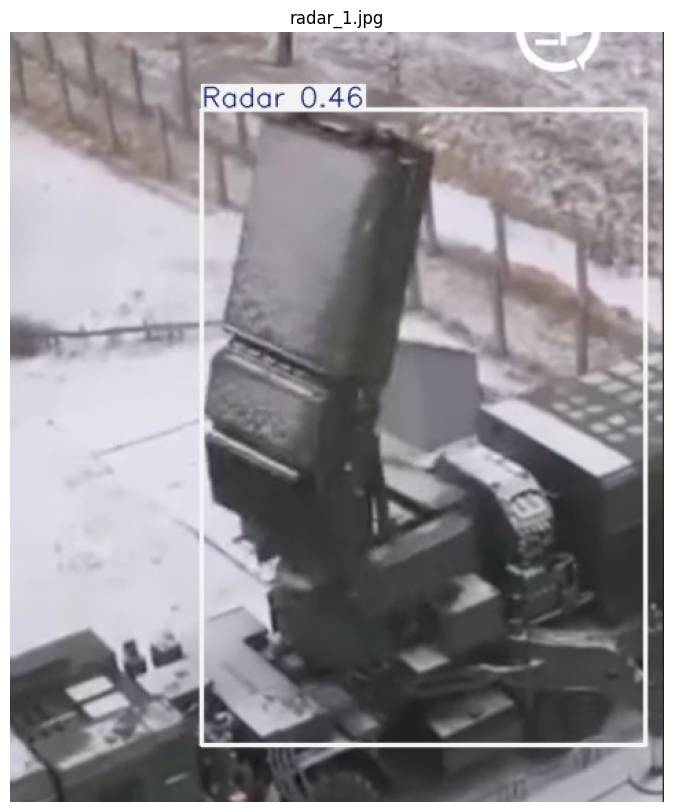

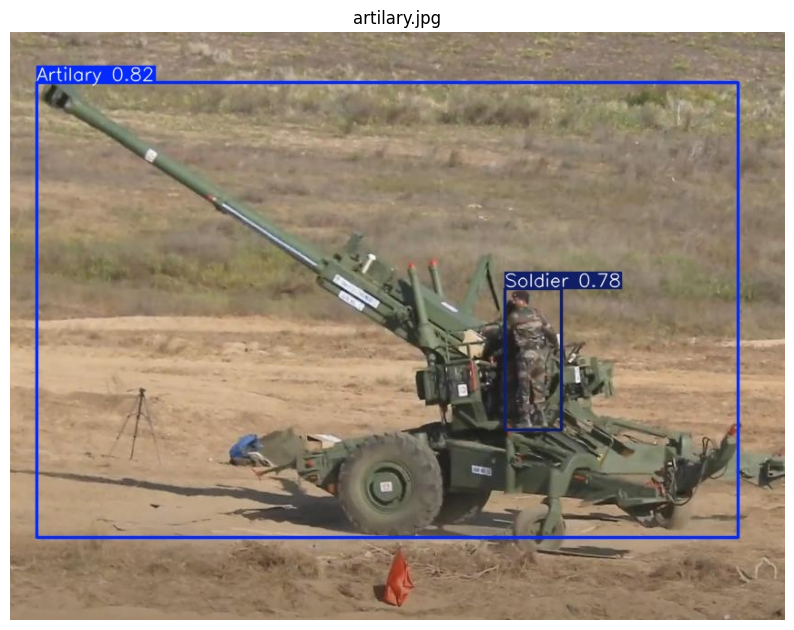

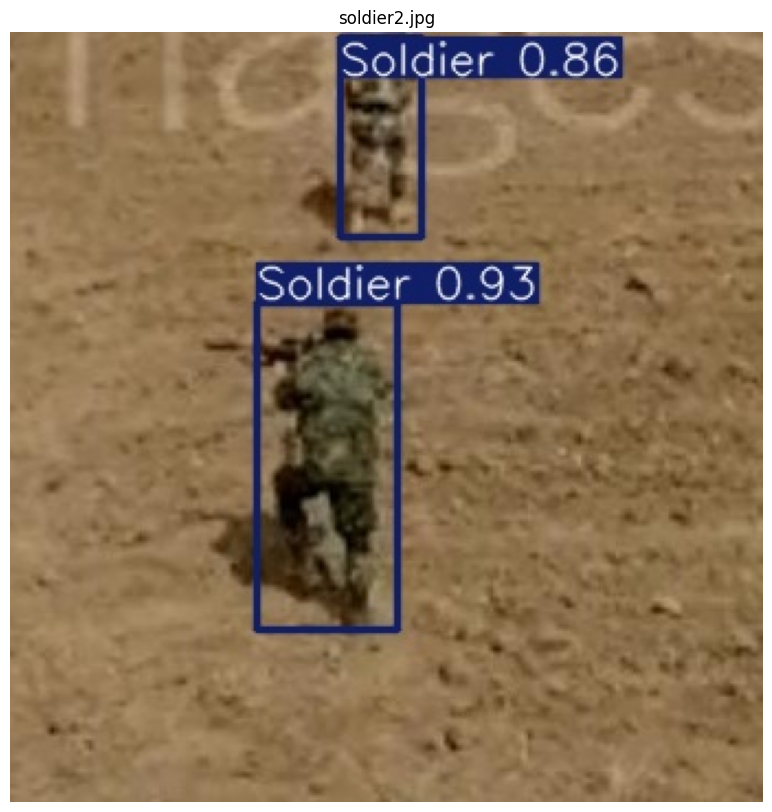

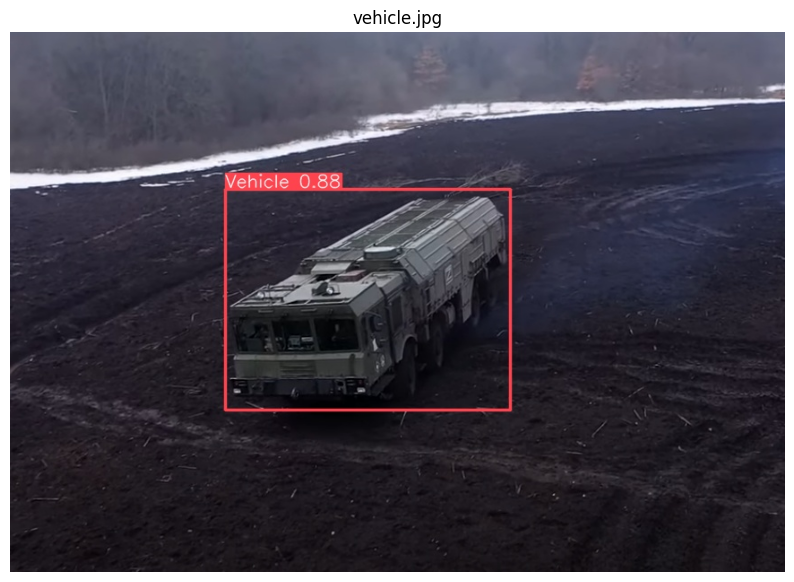

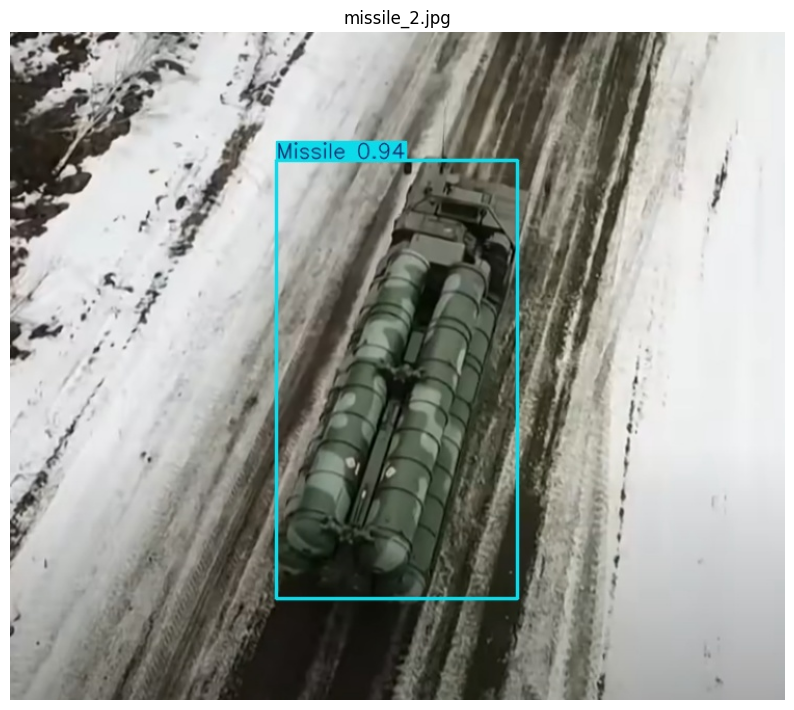

...

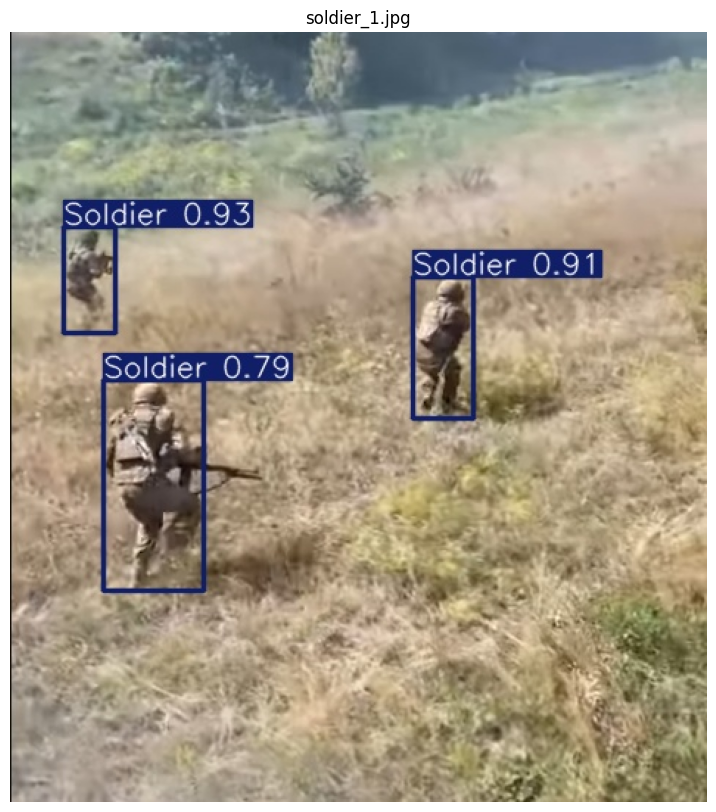

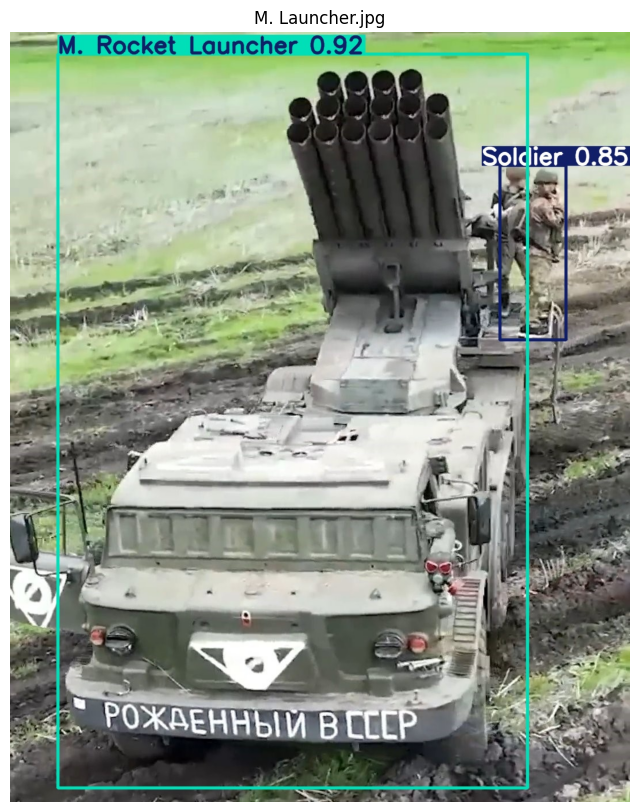

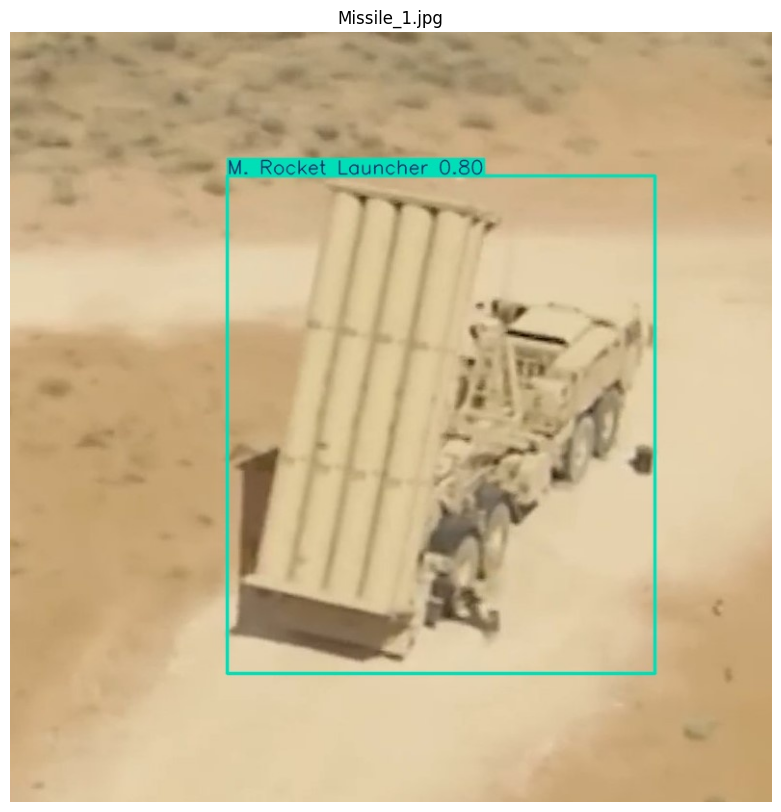

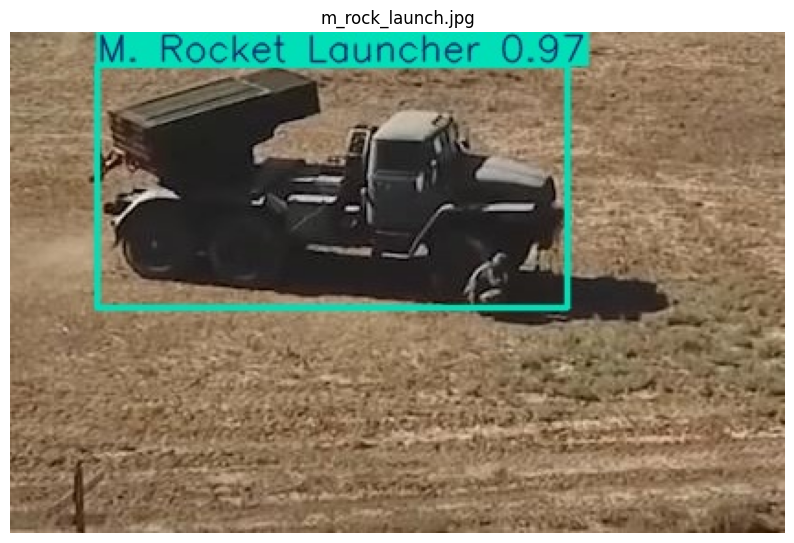

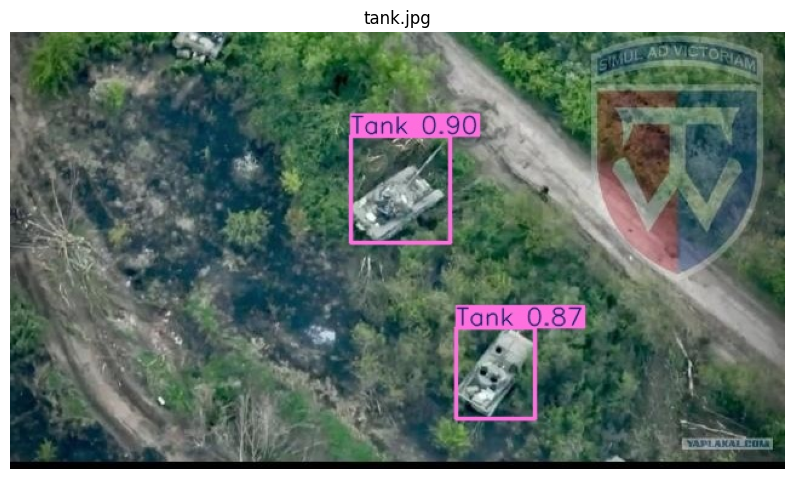

In [ ]:
import matplotlib.pyplot as plt
import cv2
import os

image_folder = 'runs/detect/predict3/'

image_files = [f for f in os.listdir(image_folder) if f.endswith(('.jpg', '.jpeg', '.webp'))]


for image_file in image_files:
    img_path = os.path.join(image_folder, image_file)
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    plt.figure(figsize=(10, 10))
    plt.imshow(img)
    plt.title(image_file)
    plt.axis('off')
    plt.show()

# Tracking - Byte Track ( Included in YOLO )

In [ ]:
!git clone https://github.com/ultralytics/ultralytics
%cd ultralytics
!pip install -e .

Cloning into 'ultralytics'...
remote: Enumerating objects: 45333, done.
remote: Counting objects: 100% (260/260), done.
remote: Compressing objects: 100% (142/142), done.
remote: Total 45333 (delta 156), reused 198 (delta 117), pack-reused 45073 (from 1)
Receiving objects: 100% (45333/45333), 37.87 MiB | 16.71 MiB/s, done.
Resolving deltas: 100% (33742/33742), done.
/content/ultralytics
Obtaining file:///content/ultralytics
  Installing build dependencies ... done
  Checking if build backend supports build_editable ... done
  Getting requirements to build editable ... done
  Preparing editable metadata (pyproject.toml) ... done
  Building editable for ultralytics (pyproject.toml) ... done
  Created wheel for ultralytics: filename=ultralytics-8.3.27-0.editable-py3-none-any.whl size=22679 sha256=d09e3df3ce5cf080685cafa76a23d4147ca1541e96000eae352ef729b07f3941
  Stored in directory: /tmp/pip-ephem-wheel-cache-r28sn4vm/wheels/9a/cd/d5/95912172899f8ec640166ff6eef49156b1b00d6b2ade4a3cb1
Succ

In [ ]:
!yolo track model='/content/runs/detect/train/weights/best.pt' source='/content/downloaded_video5.mp4' save=True #'/content/good tank moving.mp4''/content/download.mp4'

Ultralytics 8.3.27 🚀 Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLO11n summary (fused): 238 layers, 2,583,517 parameters, 0 gradients, 6.3 GFLOPs

video 1/1 (frame 1/957) /content/downloaded_video5.mp4: 640x384 2 Tanks, 2 Vehicles, 48.4ms
video 1/1 (frame 2/957) /content/downloaded_video5.mp4: 640x384 2 Tanks, 2 Vehicles, 8.6ms
video 1/1 (frame 3/957) /content/downloaded_video5.mp4: 640x384 2 Tanks, 2 Vehicles, 8.7ms
video 1/1 (frame 4/957) /content/downloaded_video5.mp4: 640x384 3 Tanks, 2 Vehicles, 8.0ms
video 1/1 (frame 5/957) /content/downloaded_video5.mp4: 640x384 3 Tanks, 2 Vehicles, 7.8ms
video 1/1 (frame 6/957) /content/downloaded_video5.mp4: 640x384 3 Tanks, 7.8ms
video 1/1 (frame 7/957) /content/downloaded_video5.mp4: 640x384 3 Tanks, 8.1ms
video 1/1 (frame 8/957) /content/downloaded_video5.mp4: 640x384 3 Tanks, 1 Vehicle, 7.7ms
video 1/1 (frame 9/957) /content/downloaded_video5.mp4: 640x384 3 Tanks, 1 Vehicle, 7.6ms
video 1/1 (frame 10/957) /content/downlo

In [ ]:
!ffmpeg -i "/content/runs/detect/track3/downloaded_video5.avi" "/content/runs/detect/track3/downloaded_video5.mp4"


ffmpeg version 4.4.2-0ubuntu0.22.04.1 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11 (Ubuntu 11.2.0-19ubuntu1)
  configuration: --prefix=/usr --extra-version=0ubuntu0.22.04.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libdav1d --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librabbitmq --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvidstab --enable-libvorbis --enable-libvpx --enab

In [ ]:
from IPython.display import Video

# Display the converted video
Video('/content/runs/detect/track/downloaded_video7.mp4', embed=True)


In [ ]:
from IPython.display import Video

# Display the converted video
Video('/content/runs/detect/track2/downloaded_video3.mp4', embed=True)


In [ ]:
from IPython.display import Video

# Display the converted video
Video('/content/runs/detect/track3/downloaded_video5.mp4', embed=True)


# Tracking - DeepSort

In [ ]:
!pip install ultralytics
!pip install deep-sort-realtime

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 881.2/881.2 kB 23.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.4/8.4 MB 59.6 MB/s eta 0:00:00


In [ ]:
import cv2
from deep_sort_realtime.deepsort_tracker import DeepSort
from ultralytics import YOLO

# Initialize YOLO model
model = YOLO('/content/drive/MyDrive/MLR/S3R2-KIIT_11NANO/detect/train/weights/best.pt')

# Initialize the DeepSORT tracker
tracker = DeepSort(max_age=30, n_init=2, max_iou_distance=0.7)

# Define the list of class names based on your specific classes
class_names = ["Artillery", "Missile", "Radar", "M. Rocket Launcher", "Soldier", "Tank", "Vehicle"]

# Set up video capture and video writer
input_video_path = "/content/downloaded_video7.mp4"
output_video_path = "tracked_output_video7.avi"

cap = cv2.VideoCapture(input_video_path)
frame_width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
frame_height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
fps = int(cap.get(cv2.CAP_PROP_FPS))

# Define codec and create VideoWriter object
fourcc = cv2.VideoWriter_fourcc(*"XVID")  # Codec for AVI files
out = cv2.VideoWriter(output_video_path, fourcc, fps, (frame_width, frame_height))

while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break

    # Run YOLOv8 detection on the frame
    results = model.predict(source=frame, save=False, save_txt=False, conf=0.5)

    # Extract bounding boxes and confidences from YOLOv8 detections
    detections = []
    class_ids = []  # List to store class IDs for each detection
    for result in results[0].boxes:
        # Convert (x1, y1, x2, y2) to (x, y, width, height)
        x1, y1, x2, y2 = result.xyxy[0].tolist()
        x, y = x1, y1
        width, height = x2 - x1, y2 - y1
        confidence = result.conf[0].item()
        class_id = int(result.cls[0].item())

        # Append detection in the format [(x, y, width, height), confidence, class_id]
        detections.append([(x, y, width, height), confidence, class_id])
        class_ids.append(class_id)  # Save the class_id for use with tracking results

    # Pass the detections to the DeepSORT tracker
    tracked_objects = tracker.update_tracks(detections, frame=frame)

    # Draw the tracking results on the frame
    for track in tracked_objects:
        if not track.is_confirmed():
            continue
        ltrb = track.to_ltrb()  # Left-Top-Right-Bottom coordinates

        # Retrieve the corresponding class ID and name
        class_id = track.det_class
        class_name = class_names[class_id] if class_id < len(class_names) else "Unknown"

        # Draw bounding box and label with only the class name
        cv2.rectangle(frame, (int(ltrb[0]), int(ltrb[1])), (int(ltrb[2]), int(ltrb[3])), (0, 255, 0), 2)
        cv2.putText(frame, class_name, (int(ltrb[0]), int(ltrb[1] - 10)),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255, 255, 255), 2)

    # Write the frame to the output video file
    out.write(frame)

# Release resources
cap.release()
out.release()
print("Tracking complete. Output saved to:", output_video_path)



0: 640x384 (no detections), 11.3ms
Speed: 1.3ms preprocess, 11.3ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 384)

0: 640x384 (no detections), 12.8ms
Speed: 1.5ms preprocess, 12.8ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 384)

0: 640x384 (no detections), 14.3ms
Speed: 1.8ms preprocess, 14.3ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 384)

0: 640x384 (no detections), 8.9ms
Speed: 1.3ms preprocess, 8.9ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 384)

0: 640x384 (no detections), 8.9ms
Speed: 1.4ms preprocess, 8.9ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 384)

0: 640x384 (no detections), 9.4ms
Speed: 1.4ms preprocess, 9.4ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 384)

0: 640x384 1 Vehicle, 9.1ms
Speed: 1.5ms preprocess, 9.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 384)

0: 640x384 2 Vehicles, 8.9ms
Speed: 2.0ms preprocess, 8.9ms inference, 1.2ms postp

In [ ]:
!pip install pydub
!apt-get install ffmpeg

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
ffmpeg is already the newest version (7:4.4.2-0ubuntu0.22.04.1).
0 upgraded, 0 newly installed, 0 to remove and 49 not upgraded.


In [ ]:
!ffmpeg -i "/content/tracked_output_video7.avi" "/content/downloaded_video7_tracked.mp4"

ffmpeg version 4.4.2-0ubuntu0.22.04.1 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11 (Ubuntu 11.2.0-19ubuntu1)
  configuration: --prefix=/usr --extra-version=0ubuntu0.22.04.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libdav1d --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librabbitmq --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvidstab --enable-libvorbis --enable-libvpx --enab

In [ ]:
from IPython.display import Video

# Display the converted video (AVI format)
Video('/content/downloaded_video3_tracked.mp4', embed=True)

In [ ]:
from IPython.display import Video

# Display the converted video (AVI format)
Video('/content/downloaded_video5_tracked.mp4', embed=True)

In [ ]:
from IPython.display import Video

# Display the converted video (AVI format)
Video('/content/downloaded_video7_tracked.mp4', embed=True)

# OC-SORT

In [ ]:
!pip install ultralytics
# Install OC-SORT dependencies
!pip install cython scipy numpy


In [ ]:
!pip install onnxruntime==1.14.0



   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.0/5.0 MB 2.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.0/46.0 kB 4.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.8/86.8 kB 8.9 MB/s eta 0:00:00


In [ ]:
!git clone https://github.com/noahcao/OC_SORT.git
%cd OC_SORT
!pip install -r requirements.txt


Cloning into 'OC_SORT'...
remote: Enumerating objects: 554, done.
remote: Counting objects: 100% (170/170), done.
remote: Compressing objects: 100% (93/93), done.
remote: Total 554 (delta 92), reused 88 (delta 73), pack-reused 384 (from 1)
Receiving objects: 100% (554/554), 45.40 MiB | 13.41 MiB/s, done.
Resolving deltas: 100% (210/210), done.
/content/OC_SORT
  Using cached loguru-0.7.2-py3-none-any.whl.metadata (23 kB)
  Using cached thop-0.1.1.post2209072238-py3-none-any.whl.metadata (2.7 kB)
  Using cached ninja-1.11.1.1-py2.py3-none-manylinux1_x86_64.manylinux_2_5_x86_64.whl.metadata (5.3 kB)
  Using cached lap-0.4.0.tar.gz (1.5 MB)
  Preparing metadata (setup.py) ... done
  Using cached onnx-1.8.1.tar.gz (5.2 MB)
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Installing backend dependencies ... done
  Preparing metadata (pyproject.toml) ... done
ERROR: Could not find a version that satisfies the requirement onnxruntime==1.8.0 (from versi

In [ ]:
from OC_SORT.trackers.ocsort_tracker.ocsort import OCSORT


In [ ]:
import cv2
from ultralytics import YOLO
from your_oc_sort_module import OCSORT  # Replace with the actual OC-SORT module

# Load your trained YOLO model
yolo_model = YOLO('/content/runs/detect/train/weights/best.pt')

# Initialize OC-SORT tracker
tracker = OCSORT()

# Open the video
video_path = '/content/downloaded_video3.mp4'
cap = cv2.VideoCapture(video_path)

# Get video properties for saving
fps = cap.get(cv2.CAP_PROP_FPS)
frame_width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
frame_height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

# Define the codec and create VideoWriter object
output_path = '/content/tracked_output.mp4'  # Change output file name if needed
fourcc = cv2.VideoWriter_fourcc(*'mp4v')  # Codec for mp4
out = cv2.VideoWriter(output_path, fourcc, fps, (frame_width, frame_height))

while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break

    # Perform object detection with YOLO
    results = yolo_model(frame)  # Assuming this returns the detections

    # Extract detection results
    detections = results.pred[0]  # Change based on how the results are structured

    # Prepare detections for the tracker (e.g., format: [x1, y1, x2, y2, confidence, class])
    formatted_detections = []
    for det in detections:
        x1, y1, x2, y2, confidence, class_id = det  # Adjust based on your model output
        formatted_detections.append([x1.item(), y1.item(), x2.item(), y2.item(), confidence.item(), class_id.item()])

    # Update the tracker with the formatted detections
    tracked_objects = tracker.update(formatted_detections)

    # Visualize the tracking results
    for obj in tracked_objects:
        # Assuming obj has attributes for bounding box and ID
        x1, y1, x2, y2, track_id = obj  # Adjust based on your tracking output
        cv2.rectangle(frame, (int(x1), int(y1)), (int(x2), int(y2)), (0, 255, 0), 2)
        cv2.putText(frame, f'ID: {track_id}', (int(x1), int(y1) - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 2)

    # Write the frame with tracking results to the output video
    out.write(frame)

    # Display the frame
    cv2.imshow('Tracking', frame)
    if cv2.waitKey(1) & 0xFF == ord('q'):
        break

# Release resources
cap.release()
out.release()  # Save the output video
cv2.destroyAllWindows()

print(f'Tracked video saved to: {output_path}')


In [ ]:
cd /content

/content


In [ ]:

!mkdir ocsort
%cd ocsort
!wget https://raw.githubusercontent.com/noahcao/OC_SORT/master/trackers/ocsort_tracker/ocsort.py
!wget https://raw.githubusercontent.com/noahcao/OC_SORT/master/trackers/ocsort_tracker/kalmanfilter.py
!wget https://raw.githubusercontent.com/noahcao/OC_SORT/master/trackers/ocsort_tracker/association.py

%cd ..

/content/ocsort
--2024-11-04 16:08:56--  https://raw.githubusercontent.com/noahcao/OC_SORT/master/trackers/ocsort_tracker/ocsort.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.110.133, 185.199.109.133, 185.199.108.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.110.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 18109 (18K) [text/plain]
Saving to: ‘ocsort.py’

ocsort.py           100%[===================>]  17.68K  --.-KB/s    in 0s      

2024-11-04 16:08:56 (128 MB/s) - ‘ocsort.py’ saved [18109/18109]

--2024-11-04 16:08:56--  https://raw.githubusercontent.com/noahcao/OC_SORT/master/trackers/ocsort_tracker/kalmanfilter.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.109.133, 185.199.110.133, 185.199.108.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.109.133|:443... connected.
HTTP request sent, awaiting response... 200 O

In [ ]:

from ocsort import ocsort

tracker = ocsort.OCSort(det_thresh=0.25)

In [ ]:
# Change directory to /content
import os
os.chdir('/content')

# Install the Ultralytics package
!pip install ultralytics


In [ ]:
!pip install git+https://github.com/ultralytics/ultralytics.git



  Cloning https://github.com/ultralytics/ultralytics.git to /tmp/pip-req-build-6u214ywh
  Running command git clone --filter=blob:none --quiet https://github.com/ultralytics/ultralytics.git /tmp/pip-req-build-6u214ywh
  Resolved https://github.com/ultralytics/ultralytics.git to commit 2875c30072e840a3573504fd32ce8d3a9bb7698d
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for ultralytics: filename=ultralytics-8.3.27-py3-none-any.whl size=879137 sha256=6a770d1047bea451c0e99db6d5812bfdd606032d62ee470c038a8059a719d861
  Stored in directory: /tmp/pip-ephem-wheel-cache-djyvqqnk/wheels/45/25/b9/9f1e3857f58c296e7854ef871c3f5a15d519cc6c679848df8e
Successfully built ultralytics
  Attempting uninstall: ultralytics
    Found existing installation: ultralytics 8.3.27
    Uninstalling ultralytics-8.3.27:
      Successfully uninstalled ultralytics-8.3.27


In [ ]:
from ultralytics import YOLO


In [ ]:
import cv2
#from ultralytics import YOLO
from ocsort import ocsort

# Load your trained YOLO model
yolo_model = YOLO('/content/runs/detect/train/weights/best.pt')

# Initialize OC-SORT tracker with a detection threshold
tracker = ocsort.OCSort(det_thresh=0.25)

# Open the video
video_path = '/content/downloaded_video3.mp4'
cap = cv2.VideoCapture(video_path)

# Get video properties for saving
fps = cap.get(cv2.CAP_PROP_FPS)
frame_width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
frame_height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

# Define the codec and create VideoWriter object
output_path = '/content/tracked_output.mp4'  # Change output file name if needed
fourcc = cv2.VideoWriter_fourcc(*'mp4v')  # Codec for mp4
out = cv2.VideoWriter(output_path, fourcc, fps, (frame_width, frame_height))

while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break

    # Perform object detection with YOLO
    results = yolo_model(frame)  # Assuming this returns the detections

    # Extract detection results
    detections = results.pred[0]  # Change based on how the results are structured

    # Prepare detections for the tracker (format: [x1, y1, x2, y2, confidence, class_id])
    formatted_detections = []
    for det in detections:
        x1, y1, x2, y2, confidence, class_id = det.tolist()  # Adjust based on your model output
        formatted_detections.append([x1, y1, x2, y2, confidence, class_id])

    # Update the tracker with the formatted detections
    tracked_objects = tracker.update(formatted_detections)

    # Visualize the tracking results
    for obj in tracked_objects:
        # Assuming obj contains bounding box coordinates and track ID
        x1, y1, x2, y2, track_id = obj  # Adjust based on your tracking output
        cv2.rectangle(frame, (int(x1), int(y1)), (int(x2), int(y2)), (0, 255, 0), 2)
        cv2.putText(frame, f'ID: {track_id}', (int(x1), int(y1) - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 2)

    # Write the frame with tracking results to the output video
    out.write(frame)

    # Display the frame
    cv2.imshow('Tracking', frame)
    if cv2.waitKey(1) & 0xFF == ord('q'):
        break

# Release resources
cap.release()
out.release()  # Save the output video
cv2.destroyAllWindows()

print(f'Tracked video saved to: {output_path}')
